# Model Comparison

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory
import os
import torch
from tqdm import tqdm

import tensorflow as tf
from darts import TimeSeries
from darts.dataprocessing.transformers import Scaler,MissingValuesFiller,InvertibleMapper,StaticCovariatesTransformer
from darts.dataprocessing import Pipeline
from darts.models import LightGBMModel,TiDEModel,NHiTSModel,TSMixerModel,NBEATSModel,TFTModel

import sklearn
from sklearn.metrics import mean_absolute_percentage_error,mean_squared_error

#Tensorboard
from torch.utils.tensorboard import SummaryWriter
from pytorch_lightning.loggers import TensorBoardLogger

# Plots
import seaborn as sns
from matplotlib import pyplot as plt
from darts import timeseries as ts
from autoviz.AutoViz_Class import AutoViz_Class
%matplotlib inline


# make it not take all memory in the GPUs
gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)
# copy all the data over all GPUs. Important to add the line "with strategy.scope():" and indent when creating and compiling the model
strategy = tf.distribute.MirroredStrategy(
    cross_device_ops=tf.distribute.HierarchicalCopyAllReduce())



2024-06-12 11:38:19.341866: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-12 11:38:19.341913: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-12 11:38:19.343311: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-06-12 11:38:19.352183: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-06-12 11:38:20.533609: W tensorflow/compiler/tf2

Imported v0.1.804. After importing autoviz, you must run '%matplotlib inline' to display charts inline.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1', '/job:localhost/replica:0/task:0/device:GPU:2')


2024-06-12 11:38:27.824489: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1929] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 15515 MB memory:  -> device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:04:00.0, compute capability: 6.0
2024-06-12 11:38:27.825123: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1929] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 15515 MB memory:  -> device: 1, name: Tesla P100-PCIE-16GB, pci bus id: 0000:05:00.0, compute capability: 6.0
2024-06-12 11:38:27.825653: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1929] Created device /job:localhost/replica:0/task:0/device:GPU:2 with 15515 MB memory:  -> device: 2, name: Tesla P100-PCIE-16GB, pci bus id: 0000:07:00.0, compute capability: 6.0


In [2]:
#path=os.getcwd()

train=pd.read_csv('../DataSet/train_sales_prices.csv',parse_dates=['Date'])
test=pd.read_csv('../DataSet/test_sales_prices.csv',parse_dates=['Date'])
train_test=pd.concat([train,test],axis=0)
train_test

,Date,store,product,number_sold
0,2010-01-01,0,0,801
1,2010-01-02,0,0,810
2,2010-01-03,0,0,818
3,2010-01-04,0,0,796
4,2010-01-05,0,0,808
...,...,...,...,...
25545,2019-12-27,6,9,901
25546,2019-12-28,6,9,926
25547,2019-12-29,6,9,913
25548,2019-12-30,6,9,899


# Exploring Data
I create a function to analyse the data such as null values, #unique values, min, max value.... Also,I am using Autoviz to analyse the correlation between the features. Since the database selected is already cleaned, no need to perform feature enginearing. I only drop set the date as index to have timeseries.
The purpose of the notebook is not the feature enginearing of the data, it focus on the performance of different types of algorithm for timeseries dataset.

In [3]:
def determine_data(df):
    numeric_columns = df.select_dtypes(include=[np.number]).columns
    outlier_threshold = 3
    
    num_uniques = df.nunique()
    null_values = df.isna()
    min_values = df[numeric_columns].min()
    max_values = df[numeric_columns].max()
    range_values = max_values - min_values
    mean_values = df[numeric_columns].mean()
    std_values = df[numeric_columns].std()        
    zscores = (df[numeric_columns] - mean_values) / std_values

    summary_stats = pd.DataFrame({
            'unique_values': num_uniques == len(df),
            'num_uniques': num_uniques,
            'null_values': null_values.any(),
            'Nan_%':round((df.isna().sum(axis=0)/len(df))*100,2),
            'dtype': df.dtypes,
            'first_row':df.iloc[0],
            'last_row':df.iloc[-1],
            'min': min_values,
            'max': max_values,
            'range': range_values,
            'median': df[numeric_columns].median(),
            'mean': mean_values,
            'std': std_values,
            'num_outliers': np.sum(abs(zscores) > outlier_threshold,axis=0),
            'max_zscore': [np.max(abs(zscores[column])) if column in 
                           numeric_columns else np.nan for column in df.columns]
                          # max_zscores = np.max(abs(zscores)) 
                          # works locally and is cleaner. However, here
                          # it returns a single value instead of a 
                          # series so the above is used.
        }, index=df.columns)
    
    return summary_stats

results=determine_data(train_test)
results

,unique_values,num_uniques,null_values,Nan_%,dtype,first_row,last_row,min,max,range,median,mean,std,num_outliers,max_zscore
Date,False,3652,False,0.0,datetime64[ns],2010-01-01 00:00:00,2019-12-31 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
store,False,7,False,0.0,int64,0,6,0.0,6.0,6.0,3.0,3.000000,2.000004,0.0,1.499997
product,False,10,False,0.0,int64,0,9,0.0,9.0,9.0,4.5,4.500000,2.872287,0.0,1.566696
number_sold,False,936,False,0.0,int64,801,886,234.0,1205.0,971.0,836.0,781.838077,204.910291,0.0,2.673551


    max_rows_analyzed is smaller than dataset shape 255640...
        randomly sampled 150000 rows from read CSV file
Shape of your Data Set loaded: (150000, 5)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    Number of Numeric Columns =  0
    Number of Integer-Categorical Columns =  3
    Number of String-Categorical Columns =  0
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  0
    Number of Numeric-Boolean Columns =  0
    Number of Discrete String Columns =  0
    Number of NLP String Columns =  1
    Number of Date Time Columns =  0
    Number of ID Columns =  0
    Number of Columns to Delete =  0
    4 Predictors classified...
        No variables removed since no ID or low-information var

,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
Unnamed: 0,int64,0.000000,94,2.000000,230089.000000,No issue
Date,object,0.000000,2,,,No issue
store,int64,0.000000,0,0.000000,6.000000,Column has a high correlation with ['Unnamed: 0']. Consider dropping one of them.
product,int64,0.000000,0,0.000000,9.000000,No issue
number_sold,int64,0.000000,0,242.000000,1205.000000,Target column


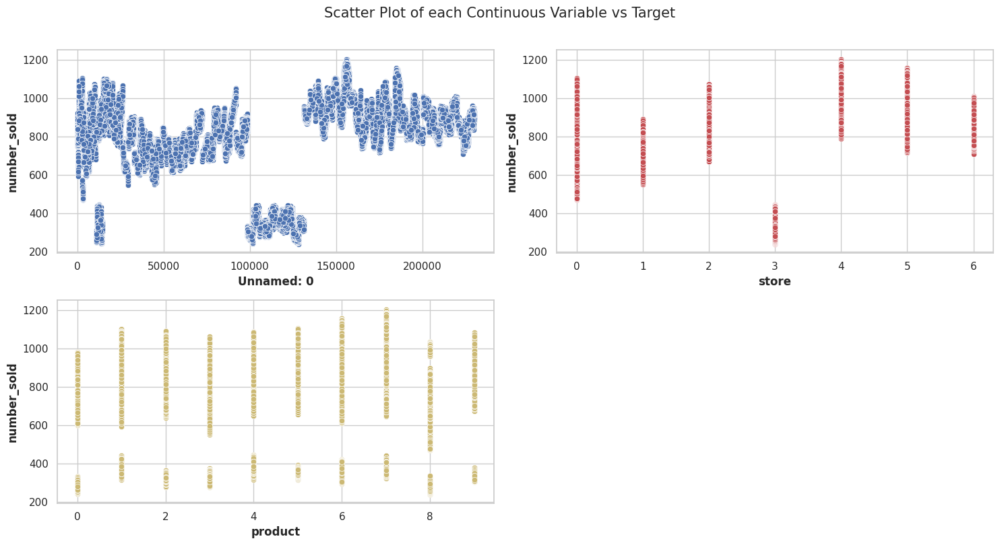

Number of All Scatter Plots = 6


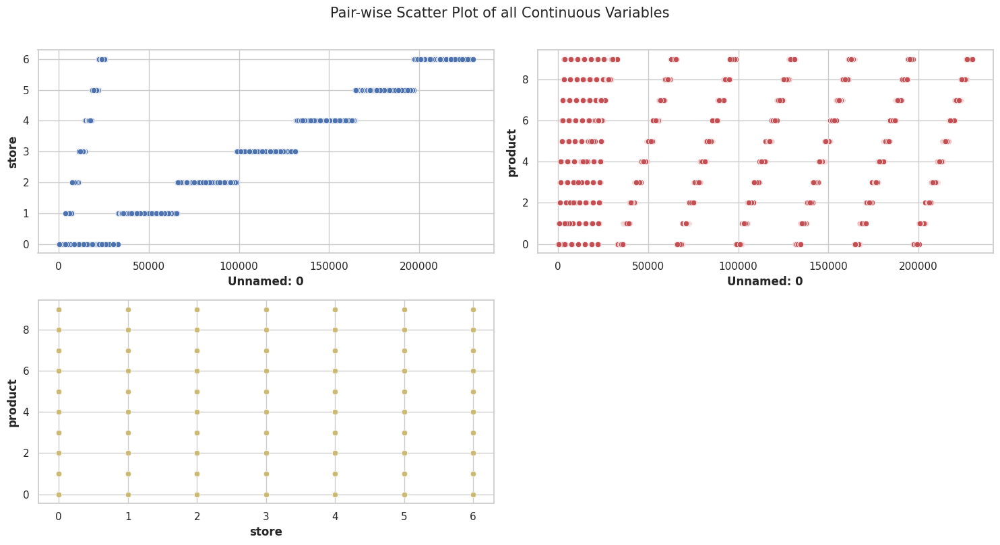

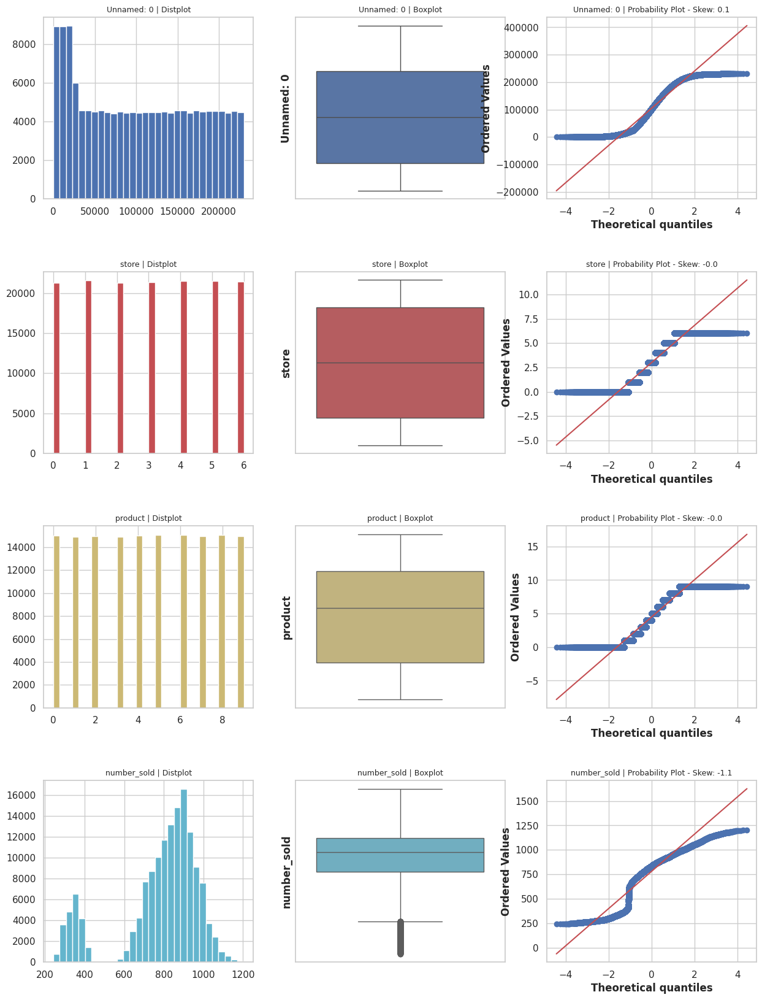

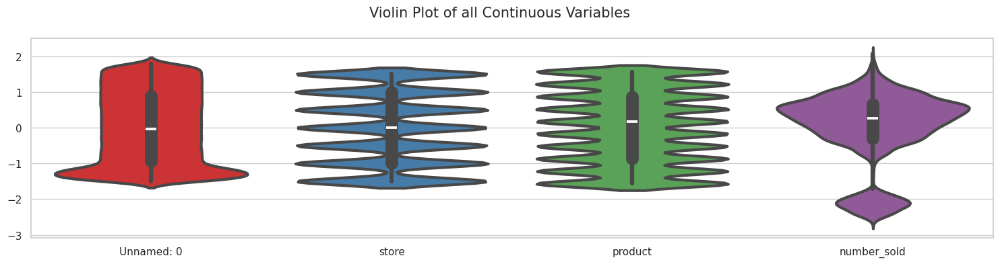

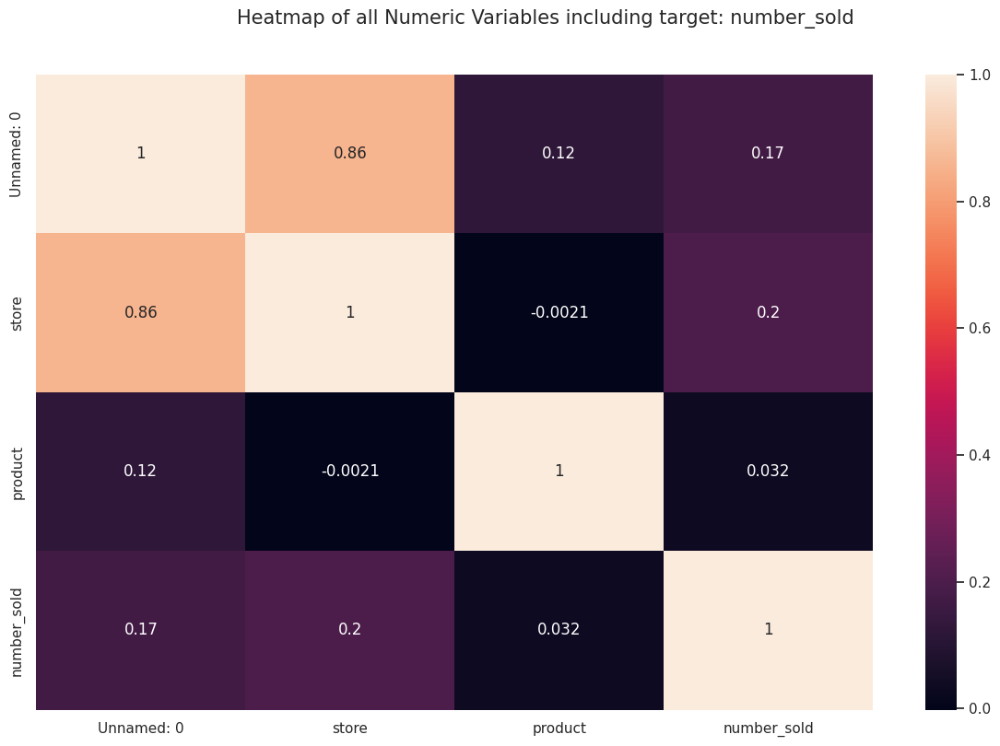

[nltk_data] Downloading collection 'popular'
[nltk_data]    | 
[nltk_data]    | Downloading package cmudict to
[nltk_data]    |     /home/maarten/nltk_data...
[nltk_data]    |   Package cmudict is already up-to-date!
[nltk_data]    | Downloading package gazetteers to
[nltk_data]    |     /home/maarten/nltk_data...
[nltk_data]    |   Package gazetteers is already up-to-date!
[nltk_data]    | Downloading package genesis to
[nltk_data]    |     /home/maarten/nltk_data...
[nltk_data]    |   Package genesis is already up-to-date!
[nltk_data]    | Downloading package gutenberg to
[nltk_data]    |     /home/maarten/nltk_data...
[nltk_data]    |   Package gutenberg is already up-to-date!
[nltk_data]    | Downloading package inaugural to
[nltk_data]    |     /home/maarten/nltk_data...
[nltk_data]    |   Package inaugural is already up-to-date!
[nltk_data]    | Downloading package movie_reviews to
[nltk_data]    |     /home/maarten/nltk_data...
[nltk_data]    |   Package movie_reviews is already

Could not draw wordcloud plot for Date
All Plots done
Time to run AutoViz = 46 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


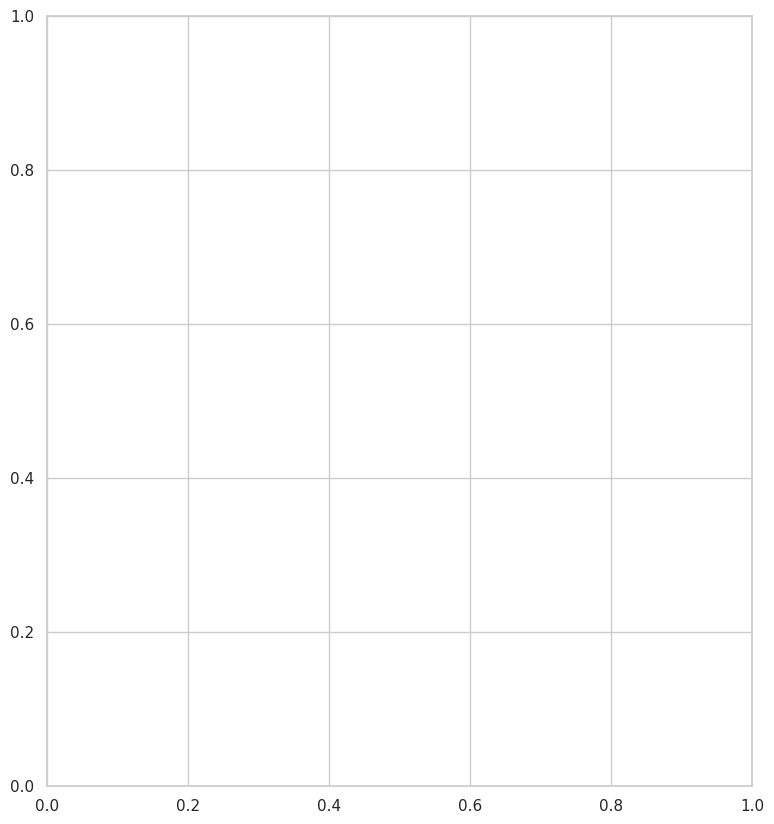

In [4]:
from autoviz.AutoViz_Class import AutoViz_Class
%matplotlib inline

train_test.to_csv('train_test.csv')

AV = AutoViz_Class()
df = AV.AutoViz('train_test.csv',depVar='number_sold')

In [5]:
train_test.set_index('Date',drop=True,inplace=True)
train_test['year']=train_test.index.year
train_test['Month']=train_test.index.month

In [6]:
train_test.tail()

,store,product,number_sold,year,Month
Date,,,,,
2019-12-27,6,9,901,2019,12
2019-12-28,6,9,926,2019,12
2019-12-29,6,9,913,2019,12
2019-12-30,6,9,899,2019,12
2019-12-31,6,9,886,2019,12


# Visualizing Data
I plot two types of graphs: Distribution overtime for the total sales and quantity of item sold per year and Month.
* Total sales distribution overtime:
    If I compare the distribution ot the average sales overtime,then the conclusion is thatthe data has a uniform  distribution, not outliers or skeness for the total sales overtime.So, I can check the skeness of the total sales distribution and follow a normal distribution. 
* Quantity of item sold per year/Month:
    Every year follows the same distribution (not a real case but allow us to focus on the model comparison instead of the data). We can see that the time series has seasonality and trend.

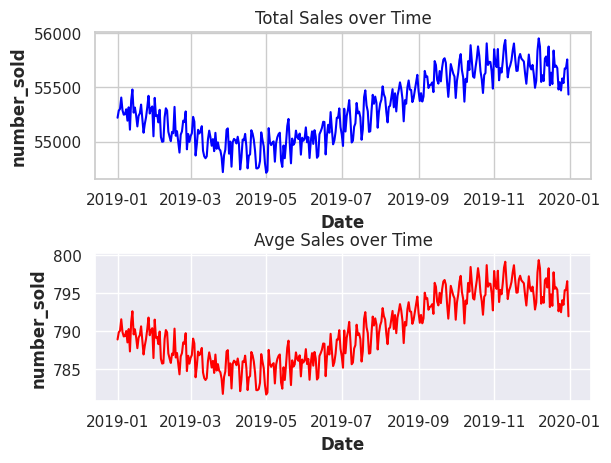

In [7]:
#Total sales over the time per year
total_sales=test.groupby([test.Date])['number_sold'].sum().reset_index()
avge_sales=test.groupby([test.Date])['number_sold'].mean().reset_index()
plt.subplot(2, 1, 1)
plt.title('Total Sales over Time')
sns.set(rc={'figure.figsize':(18,8.27)})
sns.lineplot(x=total_sales.Date,y=total_sales.number_sold,color='blue')
plt. subplots_adjust(wspace=0.2,hspace=0.5) 

plt.subplot(2, 1, 2)
plt.title('Avge Sales over Time')
sns.set(rc={'figure.figsize':(18,8.27)})
sns.lineplot(x=avge_sales.Date,y=avge_sales.number_sold,color='red')
plt.savefig('./DistributionData.jpg')
plt.show()

In [8]:
skewness = total_sales['number_sold'].skew()

def check_skeness(feature,name):
    value=feature.skew()
    if value>1:
        print('Highly positive skewed',value,name)
    elif value<-1:
        print('Highly negative skewed',value,name)
    elif -0.5<=value<=0.5:
        print('Normal distribution',value,name)
    elif 0.5<value<1:
        print('Moderate positive skewed',value,name)
    elif -1<value<-0.5:
        print('Moderate negative skewed',value,name)
        
check_skeness(total_sales['number_sold'],'number_sold')

Normal distribution 0.1532101768768885 number_sold


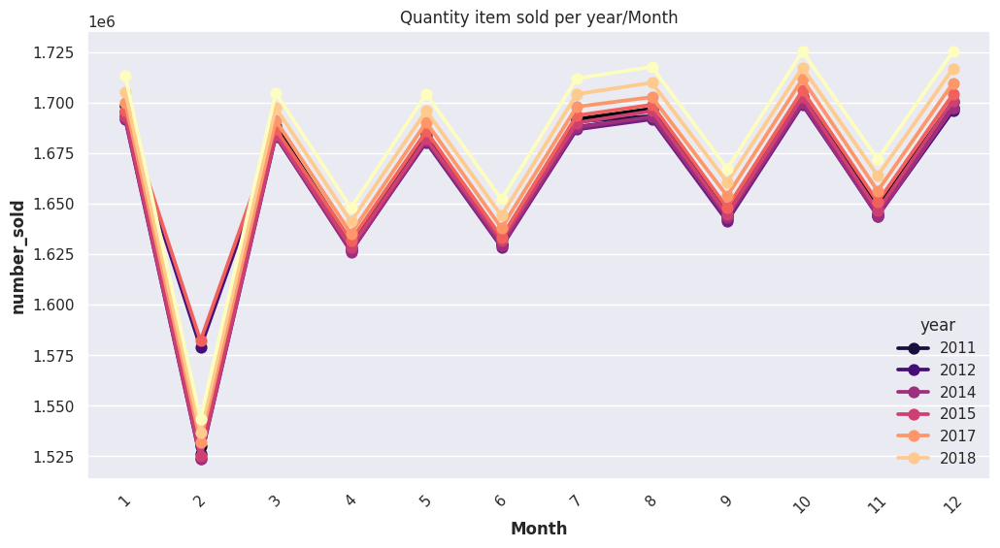

In [9]:
#We are going to plot the quantity sold each month for the different years.
grouped=train_test.groupby([train_test.year,train_test.Month])['number_sold'].sum().reset_index()

plt.figure(figsize=(12, 6))
s=sns.pointplot(x='Month',y='number_sold',hue='year',data=grouped,palette='magma')
s.set_title('Quantity item sold per year/Month')
# Rotate x-axis labels for better readability
s.set_xticklabels(s.get_xticklabels(), rotation=45)
plt.savefig('./QuantityItemSoldYearMonth.jpg')
plt.show()


# Data Darts
I will use Data Darts librarys to make the comparison between the all models performance. I need to transform the dataframe to a data darts structure.There are differents ways to organise. I have tried 3 differents options,getting the best results with the first option.

* Group the data by store and product. In total, I will have 70 time series (7 unique stores*10 unique products) of length 3287 for the train and 365 length for test.The number sold will be our target to predict. 
    
* Create one darts time series per store. I will have a list of 7 TS where each TS is group by product. (See in another notebook)
* Create one darts time series per product. I will have a list of 10 TS where each TS is group per store. (See in another notebook)

In [9]:
list_ts_sales_train= TimeSeries.from_group_dataframe(train, # 70 TS
                                time_col="Date",
                                group_cols=["store",'product'],
                                value_cols="number_sold",#target feature to predict
                                fill_missing_dates=True, 
                                freq='D')

#Filling the missing values name=Name of the transformer
train_filler = MissingValuesFiller(verbose=False, n_jobs=-1, name="Fill NAs")

# This method encode the staticCovariates features only and uses OneHotEncoder.
static_cov_transformer = StaticCovariatesTransformer(verbose=False, transformer_cat = sklearn.preprocessing.OneHotEncoder(), name="Encoder")

#This method apply a function and the inverse too if specify. It is similar to the map.
log_transformer = InvertibleMapper(np.log1p, np.expm1, verbose=False, n_jobs=-1, name="Log-Transform") 

#This method just create a pipeline ( all in order)
train_pipeline = Pipeline([train_filler,
                             static_cov_transformer,
                             log_transformer])
     

#Fit all the transformers in the pipeline and transform the data
training_transformed = train_pipeline.fit_transform(list_ts_sales_train)

print ('Total train:',len(training_transformed)*len(training_transformed[0]))

Total train: 230090


In [11]:
training_transformed[1]

<TimeSeries (DataArray) (Date: 3287, component: 1, sample: 1)>
array([[[6.74758653]],

       [[6.73815249]],

       [[6.74288064]],

       ...,

       [[6.54965074]],

       [[6.55250789]],

       [[6.56103067]]])
Coordinates:
  * Date       (Date) datetime64[ns] 2010-01-01 2010-01-02 ... 2018-12-31
  * component  (component) object 'number_sold'
Dimensions without coordinates: sample
Attributes:
    static_covariates:  static_covariates  store   product\ncomponent        ...
    hierarchy:          None

# LGBM Model
In this case LGBM model gives better performance if I create a trained model for each of the 70 TS. So, I will end up with 70 LGBM trained models. The number of lags is the length of the TS the model takes back. In this case, I select 730 corresponds to last 2 years data. We need to predict next year.

In [11]:
# Training
model_list_ts={}

for i in range(0,len(training_transformed)):

    LGBM_Model=LightGBMModel(                  
                        lags=730,
                         random_state=2022,
                        gpu_use_dp= "true", show_warning=False,verbose=-1)
    

    model_list_sales=LGBM_Model.fit(series=training_transformed[i])
    model_list_ts[i]=model_list_sales


In [12]:
#Predict
forecast_list=[]
for i in range (0, len(training_transformed)):
    
    forecast_list_sales=model_list_ts[i].predict(#Number of time steps to predict after the last value of training data.
                                     n=365,
                                     #Series used to predict the test data.Basically the training.
                                    series=training_transformed[i],verbose=-1)
    forecast_list.append(forecast_list_sales)
    

In [13]:
# Convert the prediction to a dataframe and inverse the transformation of data.
store=test.store.unique()
product=test['product'].unique()

def inverse_forecast(fcast_list):
    
    inverse_forecast_list=[]
    
    for i in range (0,len(fcast_list)):
    
        inverse_forecast=train_pipeline.inverse_transform(fcast_list[i],partial='False')
        inverse_forecast_list.append(inverse_forecast)
    
    return inverse_forecast_list

def predict_to_dataframe(forecast_list):
    
    list_of_ts=[]
    dataframe_store_list={}
    for i in range (0,len(store)):
        j=i*10
        z=10*(i+1)
        forecast_store=forecast_list[j:z]
        dataframe_store_list[i]=forecast_store
        
    for i in range(0,len(dataframe_store_list)):

        for j in range (0,len(dataframe_store_list[i])):
            
            forecast_one_ts=dataframe_store_list[i][j].pd_dataframe()
            forecast_one_ts.columns=['fcast']
            forecast_one_ts['store']=i
            forecast_one_ts['product']=j
            list_of_ts.append(forecast_one_ts)
        
    df_forecast=pd.concat(list_of_ts)
        
    return df_forecast

inverse_forecast_list_lgbm=inverse_forecast(forecast_list)

df_forecast_lgbm=predict_to_dataframe(inverse_forecast_list_lgbm)
df_forecast_lgbm.reset_index(drop=False,inplace=True)

df_prediction_lgbm=test.merge(df_forecast_lgbm,on=['Date','store','product'])
df_prediction_lgbm

,Date,store,product,number_sold,fcast
0,2019-01-01,0,0,845,841.717516
1,2019-01-02,0,0,851,839.293714
2,2019-01-03,0,0,840,838.636524
3,2019-01-04,0,0,842,840.109714
4,2019-01-05,0,0,845,841.947161
...,...,...,...,...,...
25545,2019-12-27,6,9,901,904.044942
25546,2019-12-28,6,9,926,908.095487
25547,2019-12-29,6,9,913,907.990177
25548,2019-12-30,6,9,899,898.760717


# Models: Tide, Nhits,TSMixer,N-Beats,TFT transformers

I define a generic for training a model depending on a list of models with the names. I save the model trained and have another function to load the models once I have trained them. I have used tensorboard to see based on the epochs if the model has a better accuracy.
If you would like to train a specific model, then you need to do the following changes:

* change log_dir and work_dir to your local directories.
* Uncomment the model creation i.e #model_tide=TiDEModel(**T..) with the models you would like to be trained and model list (models={})
* Uncomment the line train_models(models) if you would like to train the models.

After you have trained the models and saved in your local directory. You can load them to compare accuracies.To do that, you should follow these steps:

*  Comment the model creation ie. #model_tide=TiDEModel(**T..) with the models you would like to be trained and model list (models={}). 
*  Uncomment the line models_loaded={ } to load models.
*  Comment the line train_models(models) for load models.
*  Uncomment the line models=load_models(models_loaded)

I create a dataframe list with the prediction value for number_sold and the value of the test data. The list is used to compare accuracy and visualize results.

In [14]:
 # Directory to store logs for tensorboard (Change to your personal folder).
log_dir = '/home/maarten/logs' 
logger = TensorBoardLogger(save_dir=log_dir)

pl_trainer_kwargs ={"accelerator": "gpu", 
                    "devices": [1],
                    "logger":logger
                   }

NBeats_params={"input_chunk_length":365,
               "output_chunk_length":365,
               "output_chunk_shift":0, 
               "generic_architecture":True, 
               'num_stacks':30, #(only with generic_architecture=True because otherwise num_stacks=2 trend and seasonality)
               "num_blocks":1, 
               "num_layers":4, 
               "layer_widths":512, 
               "expansion_coefficient_dim":5, #(only with generic_architecture=True)
               #"trend_polynomial_degree":2, #(only use with generic_architecture=False)
               "dropout":0.1, 
               'batch_size':32,
               "activation":'ReLU',
               "loss_fn": torch.nn.L1Loss(),
                "optimizer_kwargs": {"lr": 1e-3},
               "random_state":42,
               "n_epochs": 20,
               "save_checkpoints":True,
               "log_tensorboard":True,
               'pl_trainer_kwargs':pl_trainer_kwargs
              }

TiDE_params = {
    "input_chunk_length":365 , # number of days to lookback 
    "output_chunk_length":365, #
    "num_encoder_layers": 1,
    "num_decoder_layers": 1,
    "decoder_output_dim": 16,
    "hidden_size": 128,
    "temporal_width_past": 4,
    "temporal_width_future": 4,
    "temporal_decoder_hidden": 32,
    "dropout": 0.1,
    "batch_size": 64,
    "n_epochs": 40,
    "random_state": 42,
    "use_static_covariates": True,
    "optimizer_kwargs": {"lr": 1e-3},
    "use_reversible_instance_norm": True,
     "save_checkpoints":True,
    'pl_trainer_kwargs':pl_trainer_kwargs,
    "log_tensorboard":True # Tensordboard parameter to log the training.
    }

Nhits_params = {
    "input_chunk_length": 365, # number of months to lookback
    "output_chunk_length":365,
    "num_blocks": 1,
    "num_layers": 2,
    "layer_widths": 512,
    "loss_fn": torch.nn.L1Loss(), #Accuracy
    "dropout": 0.1,
    "n_epochs": 40,
    "random_state": 42,
    "optimizer_kwargs": {"lr": 1e-3},
     "save_checkpoints":True,
    'pl_trainer_kwargs':pl_trainer_kwargs,
    "log_tensorboard":True # Tensordboard parameter to log the training.
    }

# learning rate scheduler
lr_scheduler_cls = torch.optim.lr_scheduler.ExponentialLR
lr_scheduler_kwargs = {"gamma": 0.999}

TSMixer_params = {
    "input_chunk_length":365,
    "output_chunk_length":365,
    "num_blocks":2,
    "hidden_size": 128,
    "ff_size": 64,
    "lr_scheduler_cls": lr_scheduler_cls,
    "lr_scheduler_kwargs": lr_scheduler_kwargs,
    "norm_type": 'LayerNorm',
    "loss_fn": torch.nn.L1Loss(),
    "use_static_covariates": True,
    'normalize_before':True,
    "dropout": 0.1,
    "n_epochs": 40,
    "random_state": 42,
    "optimizer_kwargs": {"lr": 1e-3},
     "save_checkpoints":True,
    'pl_trainer_kwargs':pl_trainer_kwargs,
    "log_tensorboard":True # Tensordboard parameter to log the training.
    }

TFT_params={"input_chunk_length":365,
               "output_chunk_length":365,
               "output_chunk_shift":0, 
               "hidden_size":64, #Important parameter to tune
               'lstm_layers':1, 
               "num_attention_heads":4, 
              # "full_attention":False, #Only attention to the previous, if true, attention to the previous,current and future 
               #"feed_forward":'GatedResidualNetwork', #Type of activation (“GLU”, “Bilinear”, “ReGLU”, “GEGLU”, “SwiGLU”, “ReLU”, “GELU”)
               "dropout":0.1, 
               #"hidden_continuous_size":8, #Default value
                "add_relative_index":True, #Need future covariates to work. So it generates automatically them.
                "norm_type":'LayerNorm',# Type of different LayerNorm (“LayerNorm”, “RMSNorm”, “LayerNormNoBias”)
                #"use_static_covariates":False, #Wether you use static covariates or not
                "batch_size":32,
               "loss_fn": torch.nn.L1Loss(),
                "optimizer_kwargs": {"lr": 1e-3},
               "random_state":42,
               "n_epochs": 20,
               "save_checkpoints":True,
               "log_tensorboard":True,
               'pl_trainer_kwargs':pl_trainer_kwargs
              }
 
#Local directory for saving the models after trained. Change for your local directory. 
work_dir='/ai/jupyter/Esther/Models/'

#Name of the models to load and save them.
model_name_tide='Tide_v1'
model_name_nhits='Nhits_v1'
model_name_TSMixer='TSMixer_v1'
model_name_NBeats='NBeats_v1'
model_name_TFT='TFT_v1'

#Uncomment the model you would like to train, otherwise keep it commented.

model_tide = TiDEModel(**TiDE_params,work_dir=work_dir,model_name=model_name_tide)
model_nhits =NHiTSModel(**Nhits_params, work_dir=work_dir,model_name=model_name_nhits)
model_TSMixer=TSMixerModel(**TSMixer_params,work_dir=work_dir,model_name=model_name_TSMixer)
model_NBeats=NBEATSModel(**NBeats_params,work_dir=work_dir,model_name=model_name_NBeats)
model_TFT=TFTModel(**TFT_params,work_dir=work_dir,model_name=model_name_TFT)

#Uncomment the models to be trained, otherwise commented.
models={
 'Tide':model_tide,
       'TSMixer':model_TSMixer
    'Nhits':model_nhits,
    'NBeats':model_NBeats,
       'TFT':model_TFT}

def train_models(models_list):
    
    for name, model in tqdm(models_list.items()):
        model.fit(series=training_transformed,verbose=True)
        model_file_path = os.path.join(work_dir+model.model_name, 'model.pth')
        model.save(model_file_path)
        models[name] = model.load(model_file_path)
    return

#Uncomment if you wish to train models,otherwise comment this line
train_models(models)

#Uncomment if you wish to load models, otherwise comment these lines
models_loaded={'Tide':model_name_tide,
             'Nhits':model_name_nhits,
              'TSMixer':model_name_TSMixer,
               'NBeats':model_name_NBeats,
              'TFT':model_name_TFT}

#Load the models already trained and store in the local directory
def load_models(models_list):

    models={}
    for model,name in models_list.items():
        
        model_file_path = os.path.join(work_dir+name, 'model.pth')
        if model=='Tide':
            models[model] = TiDEModel.load(model_file_path)
        elif model=='Nhits':
            models[model] = NHiTSModel.load(model_file_path)
        elif model=='TSMixer':
            models[model] = TSMixerModel.load(model_file_path)
        elif model=='NBeats':
            models[model] = NBEATSModel.load(model_file_path)
        elif model=='TFT':
            models[model] = TFTModel.load(model_file_path)
            
    return models

#Uncommnent if you wish to load the models, otherwise comment this line
#models=load_models(models_loaded)


In [25]:
# Make the prediction for each model and add to a list of forecast.

forecast_list={}

def forecast_models(models_list):
   
    for name, model in tqdm(models_list.items()):
        print(name,model)
        forecast=model.predict(n=365,series=training_transformed,verbose=-1)
        forecast_list[name]=forecast
    return 

forecast_models(models)

#Make a list of dataframes Prediction (fcast) with the actual test value for the target (number_sold), so we can easily
#compare the accuracy.

df_prediction_list={}

  0%|          | 0/5 [00:00<?, ?it/s]Trainer will use only 1 of 3 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=3)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2]


Tide TiDEModel(input_chunk_length=365, output_chunk_length=365, batch_size=64, n_epochs=40, random_state=42, optimizer_kwargs={'lr': 0.001}, use_reversible_instance_norm=True, save_checkpoints=True, work_dir=./, model_name=Tide_v1)
Predicting DataLoader 0: 100%|██████████| 2/2 [00:00<00:00,  9.11it/s]

 20%|██        | 1/5 [00:00<00:01,  2.63it/s]Trainer will use only 1 of 3 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=3)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2]



Nhits NHiTSModel(input_chunk_length=365, output_chunk_length=365, loss_fn=L1Loss(), n_epochs=40, random_state=42, optimizer_kwargs={'lr': 0.001}, save_checkpoints=True, work_dir=./, model_name=Nhits_v1)
Predicting DataLoader 0: 100%|██████████| 3/3 [00:00<00:00, 17.87it/s]

 40%|████      | 2/5 [00:00<00:00,  3.29it/s]Trainer will use only 1 of 3 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=3)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.



TSMixer TSMixerModel(hidden_size=128, normalize_before=True, input_chunk_length=365, output_chunk_length=365, lr_scheduler_cls=<class 'torch.optim.lr_scheduler.ExponentialLR'>, lr_scheduler_kwargs={'gamma': 0.999}, loss_fn=L1Loss(), n_epochs=40, random_state=42, optimizer_kwargs={'lr': 0.001}, save_checkpoints=True, work_dir=./, model_name=TSMixer_v1)


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2]


Predicting DataLoader 0: 100%|██████████| 3/3 [00:00<00:00, 16.28it/s]


 60%|██████    | 3/5 [00:00<00:00,  3.26it/s]GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2]


NBeats NBEATSModel(layer_widths=512, dropout=0.1, input_chunk_length=365, output_chunk_length=365, batch_size=32, loss_fn=L1Loss(), optimizer_kwargs={'lr': 0.001}, random_state=42, n_epochs=20, save_checkpoints=True, log_tensorboard=True, pl_trainer_kwargs={'accelerator': 'gpu', 'devices': [1], 'logger': <pytorch_lightning.loggers.tensorboard.TensorBoardLogger object at 0x7f185c457730>}, work_dir=/ai/jupyter/Esther/Models/, model_name=NBeats_v1)
Predicting DataLoader 0: 100%|██████████| 3/3 [00:00<00:00, 14.43it/s]


 80%|████████  | 4/5 [00:01<00:00,  2.00it/s]GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2]


TFT TFTModel(add_relative_index=True, loss_fn=L1Loss(), input_chunk_length=365, output_chunk_length=365, batch_size=32, optimizer_kwargs={'lr': 0.001}, random_state=42, n_epochs=20, save_checkpoints=True, log_tensorboard=True, pl_trainer_kwargs={'accelerator': 'gpu', 'devices': [1], 'logger': <pytorch_lightning.loggers.tensorboard.TensorBoardLogger object at 0x7f1a7c8e8c10>}, work_dir=/ai/jupyter/Esther/Models/, model_name=TFT_v1)
Predicting DataLoader 0: 100%|██████████| 3/3 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:03<00:00,  1.43it/s]

In [16]:
#Make a list of dataframes Prediction (fcast) with the actual test value for the target (number_sold), so we can easily
#compare the accuracy.

df_prediction_list={}

def df_prediction_models(fcast_list):
    
    for key, fcast in tqdm(fcast_list.items()):
        
        inv_fcast=inverse_forecast(fcast)
        df_fcast=predict_to_dataframe(inv_fcast)
        df_fcast.reset_index(drop=False,inplace=True)
        df_pred_fcast=test.merge(df_fcast,on=['Date','store','product'])
        df_prediction_list[key]=df_pred_fcast
    
    return  

df_prediction_models(forecast_list)
df_prediction_list

100%|██████████| 5/5 [00:08<00:00,  1.68s/it]


{'Tide':          Date     store  product  number_sold     fcast  
 0     2019-01-01    0       0         845      842.722708
 1     2019-01-02    0       0         851      853.708274
 2     2019-01-03    0       0         840      840.391843
 3     2019-01-04    0       0         842      843.072033
 4     2019-01-05    0       0         845      847.057598
 ...          ...    ...      ...          ...         ...
 25545 2019-12-27    6       9         901      904.468468
 25546 2019-12-28    6       9         926      911.830166
 25547 2019-12-29    6       9         913      905.770984
 25548 2019-12-30    6       9         899      901.163998
 25549 2019-12-31    6       9         886      886.877229
 
 [25550 rows x 5 columns],
 'Nhits':          Date     store  product  number_sold     fcast  
 0     2019-01-01    0       0         845      849.952437
 1     2019-01-02    0       0         851      849.526218
 2     2019-01-03    0       0         840      849.500595
 3     201

In [17]:
#Add the LGBM prediction to the list of dataframe prediction.
df_prediction_list['LGBM']=df_prediction_lgbm
list_keys=df_prediction_list.keys()
n_rows=len(list_keys)
print('Number of models prediction: ',n_rows)

Number of models prediction:  6


# Visualize Prediction
Create several plots to compare prediction:
* Total sales
* Group by date
* Group by store: Allow us to see what store is better predicted.
* Group by product. Alow us to see what product is better predicted.

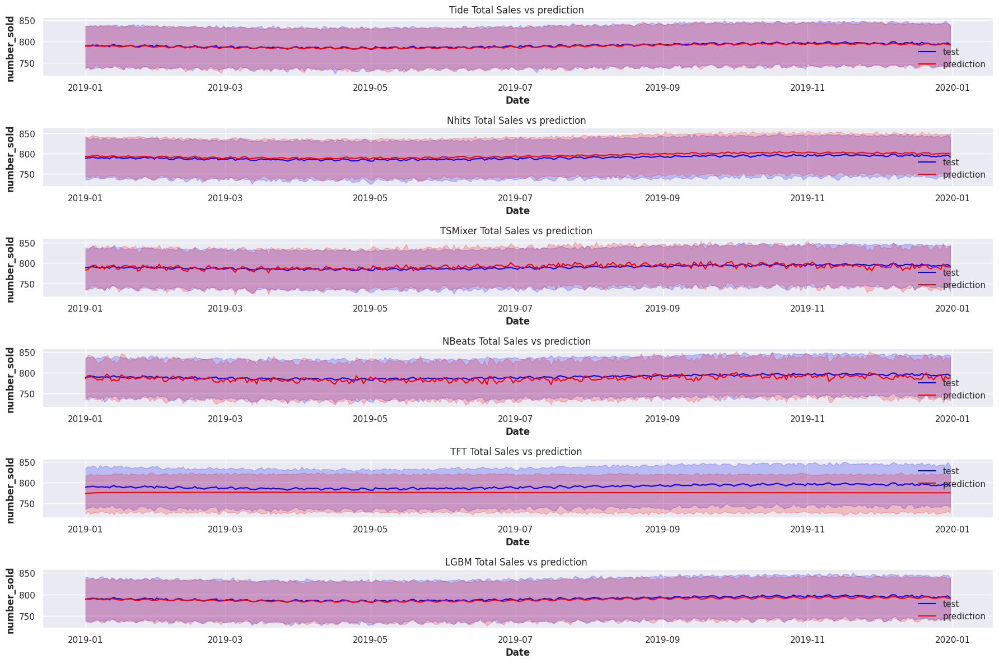

In [18]:
def plot_prediction(df_list):
    
    fig, axes = plt.subplots(nrows=n_rows,figsize=(18, 12))
    count=0
    for key in list_keys:
        axes[count].set_title(key+' Total Sales vs prediction ')
        sns.lineplot(x=df_list[key].Date,y=df_list[key].number_sold,color='blue',label='test',ax=axes[count])
        sns.lineplot(x=df_list[key].Date,y=df_list[key].fcast,color='red',label='prediction',ax=axes[count])
        count=count+1
    
    plt. subplots_adjust(wspace=0.2,hspace=0.5) 
    plt.tight_layout()
    plt.show()
    fig.savefig('./prediction.jpg')    

    return

plot_prediction(df_prediction_list)


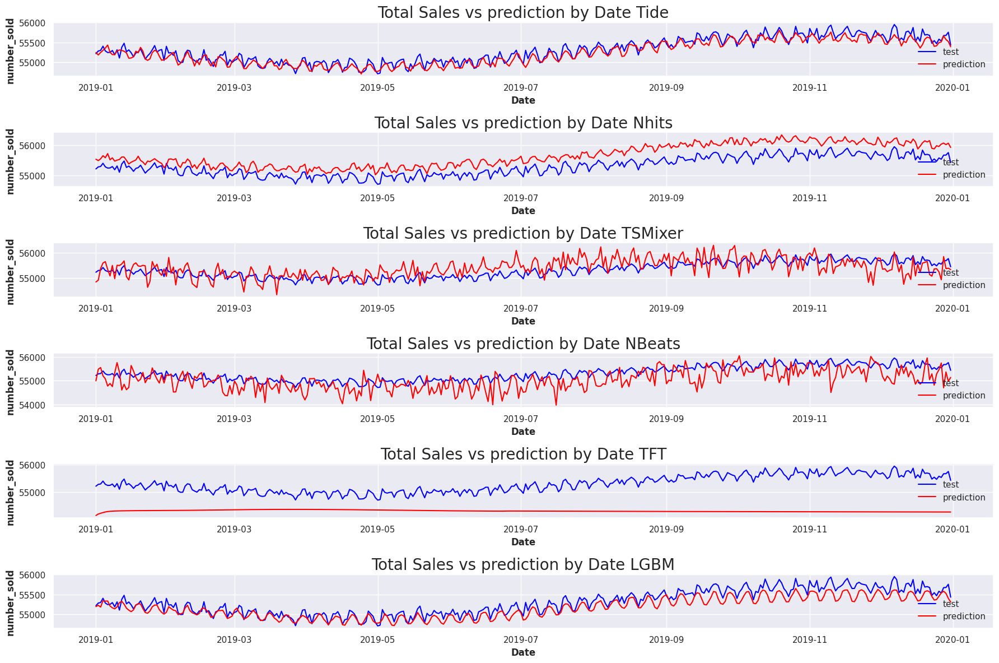

In [19]:
#Plot the prediction vs the real value by date

def plot_prediction_by_date(df_list):
    
    fig, axes = plt.subplots(nrows=n_rows,figsize=(18, 12))
    count=0
    total_sales_list={}
    total_sales_fcast_list={}
    
    for key in list_keys:
        
        total_sales=df_list[key].groupby([df_list[key].Date])['number_sold'].sum().reset_index()
        total_sales_forecast=df_list[key].groupby([df_list[key].Date])['fcast'].sum().reset_index()
        total_sales_by_date=total_sales.merge(total_sales_forecast,on=['Date'])
        axes[count].set_title('Total Sales vs prediction by Date '+ key,fontsize=20)
        sns.lineplot(x=total_sales.Date,y=total_sales.number_sold,color='blue',label='test',ax=axes[count])
        sns.lineplot(x=total_sales_forecast.Date,y=total_sales_forecast.fcast,color='red',label='prediction',ax=axes[count])
        count=count+1
        total_sales_list[key]=total_sales_by_date
        
    plt. subplots_adjust(wspace=0.2,hspace=0.5)
    plt.tight_layout()
    plt.show()
    fig.savefig('./predictionbydate.jpg')
    return total_sales_list


total_sales_by_date=plot_prediction_by_date(df_prediction_list)

In [20]:
#Plot the prediction vs the real value per store
 
def plot_prediction_by_store(df_list):
    
    fig, axes = plt.subplots(nrows=len(store),ncols=n_rows,figsize=(24, 24),dpi=300)
    count=0
    total_store_list={}
    total_store_fcast_list={}
    
    for key in list_keys:
        df=df_list[key]
        for i in range(0,len(store)):
            df_store=df[df.store==i]
            total_per_store=df_store.groupby([df_store.Date])['number_sold'].sum().reset_index()
            total_per_store_forecast=df_store.groupby([df_store.Date])['fcast'].sum().reset_index()
            total_store=total_per_store.merge(total_per_store_forecast,on=['Date'])
            axes[i,count].set_title('Store '+str(i)+' '+key,fontsize=20)
            
            s=sns.lineplot(x=total_per_store.Date,y=total_per_store.number_sold,color='blue',label='test',ax=axes[i,count])
            s.set_xticklabels(s.get_xticklabels(), rotation=45)
            s1=sns.lineplot(x=total_per_store_forecast.Date,y=total_per_store_forecast.fcast,color='red',
                         label='prediction',ax=axes[i,count])
            s1.set_xticklabels(s.get_xticklabels(), rotation=45)
        
        count=count+1
        total_store_list[key]=total_store
    
    plt. subplots_adjust(wspace=0.2,hspace=0.5) 
    plt.tight_layout()
    plt.show()
    fig.savefig('./predictionstore.jpg')
    
    return total_store_list

total_store_list=plot_prediction_by_store(df_prediction_list)


In [21]:
#Plot the prediction vs the real value per product
 
def plot_prediction_by_product(df_list):
    
    fig, axes = plt.subplots(nrows=len(product),ncols=n_rows,figsize=(24, 24),dpi=300)
    count=0
    total_product_list={}
    total_product_fcast_list={}
    
    for key in list_keys:
        
        df=df_list[key]
        
        for i in range(0,len(product)):
        
            df_product=df[df['product']==i]
            total_per_product=df_product.groupby([df_product.Date])['number_sold'].sum().reset_index()
            total_per_product_forecast=df_product.groupby([df_product.Date])['fcast'].sum().reset_index()
            total_product=total_per_product.merge(total_per_product_forecast,on=['Date'])
            axes[i,count].set_title('Product '+str(i)+' '+key,fontsize=20)

            s=sns.lineplot(x=total_per_product.Date,y=total_per_product.number_sold,color='blue',label='test',ax=axes[i,count])
            s.set_xticklabels(s.get_xticklabels(), rotation=45)
            s1=sns.lineplot(x=total_per_product_forecast.Date,y=total_per_product_forecast.fcast,color='red',
                         label='prediction',ax=axes[i,count])
            s1.set_xticklabels(s.get_xticklabels(), rotation=45)
        
        count=count+1
        total_product_list[key]=total_product
    
    plt. subplots_adjust(wspace=0.2,hspace=0.5)
    plt.tight_layout()
    plt.show()
    fig.savefig('./predictionbyproduct.jpg')
    
    return total_product_list

total_product_list=plot_prediction_by_product(df_prediction_list)


# Calculate Accuracy
Compare the accuracy of the model with the MAPE metric and plot the result for the different models. Best results are with Tide, Nhits and Nbeats. TFT model doesn't give good results.

In [22]:
# Calculate MAPE
def mape_test(y_true,y_predict):
    return mean_absolute_percentage_error(y_true,y_predict)

def calculate_metric(df_list):
    
    mape_list={}
    
    for key in list_keys:
        
        total_mape=round(mape_test(df_list[key].number_sold,df_list[key].fcast)*100,2)
        mape_list[key]=total_mape
        
    return mape_list


def metric_table(metric_list,name):
    
    metric=pd.DataFrame(metric_list.items(),columns=['Model',name])
    metric.set_index('Model',inplace=True)
    
    return metric

def comparison_table(metric_list):
    
    comparison_table=pd.DataFrame()
    for name, metric_lst in tqdm(metric_list.items()):
        
        df_metric=metric_table(metric_lst,name)
        #Merge all tables
        comparison_table=pd.concat([comparison_table,df_metric],axis=1)
        
    return comparison_table

mape_list={}

mape_list['MAPE']=calculate_metric(df_prediction_list)
mape_list['Total Mape by Date %']=calculate_metric(total_sales_by_date)
mape_list['Total Mape by Store %']=calculate_metric(total_store_list)
mape_list['Total Mape by Product %']=calculate_metric(total_product_list)  

comparison_table_mape=comparison_table(mape_list)
comparison_table_mape
                                     

100%|██████████| 4/4 [00:00<00:00, 785.89it/s]


,MAPE,Total Mape by Date %,Total Mape by Store %,Total Mape by Product %
Model,,,,
Tide,1.66,0.17,0.32,0.47
Nhits,1.79,0.64,0.88,0.44
TSMixer,2.44,0.51,0.60,0.72
NBeats,1.83,0.63,0.59,0.81
TFT,6.16,1.78,1.35,2.38
LGBM,1.99,0.25,0.31,0.44


In [23]:
#Function to log the metric in tensordboard.
def log_metric_tensor(accuracy_list,params):
    
    accuracy=accuracy_list['MAPE']['TFT']

    # Initialize the SummaryWriter
    writer = SummaryWriter(log_dir=log_dir)

    log_hyperparameters = {
        'input_chunk_length':365, 
        'output_chunk_length':params['output_chunk_length'],
        'hidden_size': params['hidden_size'],
        'lstm_layers': params['lstm_layers'],
        'num_attention_heads':params['num_attention_heads'],
        'dropout': params['dropout'],
        'batch_size':params['batch_size'],
        'n_epochs': params['n_epochs']
    }

    # Define the metrics
    metrics = {
        'MAPE': float(accuracy)
    }

    # Log hyperparameters and metrics
    writer.add_hparams(log_hyperparameters, metrics)

    writer.close()
    return

log_metric_tensor(mape_list,TFT_params)

#Plot a bar chart for MAPE
df_metrics=pd.DataFrame({'MAPE':comparison_table_mape.MAPE.values},
                        index=comparison_table_mape.index)
df_metrics

,MAPE
Model,
Tide,1.66
Nhits,1.79
TSMixer,2.44
NBeats,1.83
TFT,6.16
LGBM,1.99


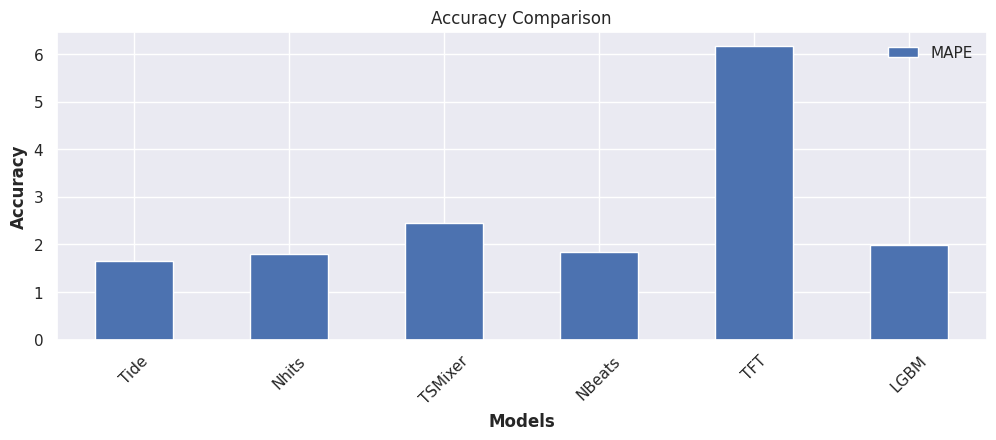

In [24]:
df_metrics.plot.bar(figsize=(12, 4))
plt.xlabel('Models')
plt.ylabel('Accuracy')
plt.title('Accuracy Comparison')
plt.xticks(rotation=45)
plt.show()